In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib
%matplotlib inline
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] =14
matplotlib.rcParams['figure.figsize']=(10,6)
matplotlib.rcParams['figure.facecolor']='#00000000'
df=pd.read_csv('abfss://c0bfb230-b305-467c-92d1-ca594c62c190@onelake.dfs.fabric.microsoft.com/7f6fceac-cc9d-4233-a25c-021aadab570d/Files/weatherAUS.csv')
df.head()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 5, Finished, Available, Finished)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,WNW,20.0,24.0,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,WSW,4.0,22.0,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,WSW,19.0,26.0,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,E,11.0,9.0,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,NW,7.0,20.0,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [4]:
df.info()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 6, Finished, Available, Finished)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

Data Cleaning and Visualization

In [5]:
#Dropping rows with null values in the raintoday and raintomorrow columns
df.dropna(subset=['RainToday','RainTomorrow'],inplace=True)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 7, Finished, Available, Finished)

In [6]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] =14
matplotlib.rcParams['figure.figsize']=(10,6)
matplotlib.rcParams['figure.facecolor']='#00000000'

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 8, Finished, Available, Finished)

In [7]:
#counting the number of times it rained or not in a particular location
px.histogram(df,x='Location',color='RainToday',title='Location vs RainToday')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 9, Finished, Available, Finished)

In [8]:
px.histogram(df,x='Temp3pm',color='RainTomorrow',title='Temperature at 3pm vs Rain Tomorrow')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 10, Finished, Available, Finished)

In [9]:
px.histogram(df,x='RainTomorrow',color='RainToday',title='RainTomorrow vs RainToday')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 11, Finished, Available, Finished)

In [10]:
px.strip(df.sample(2000),x='Temp3pm',y='Humidity3pm',color='RainTomorrow',title='Temp3pm vs Humidity3pm')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 12, Finished, Available, Finished)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 13, Finished, Available, Finished)

<Axes: title={'center': 'No. of Rows Per Year'}, xlabel='Date', ylabel='count'>

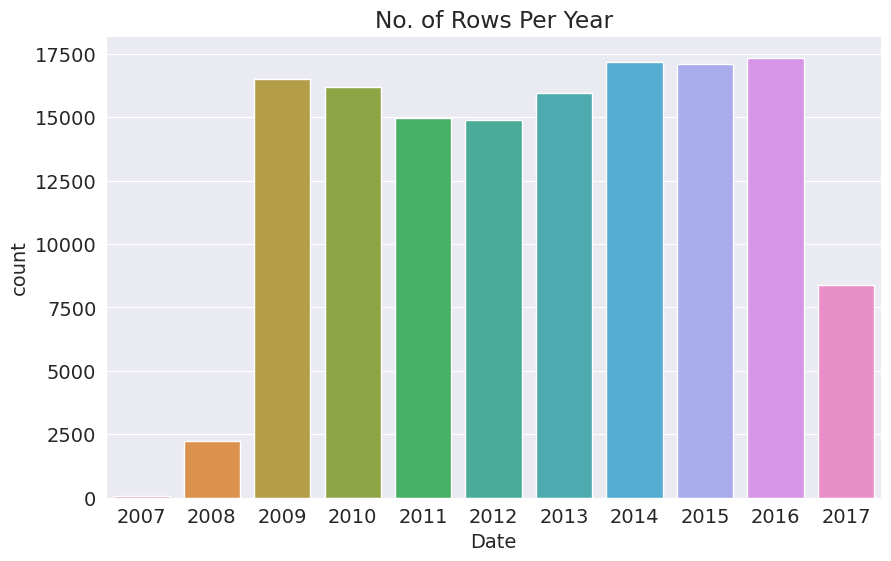

In [11]:
plt.title('No. of Rows Per Year')
sns.countplot(x=pd.to_datetime(df.Date).dt.year)

In [12]:
#when working with millions of rows it is addvisable to use a sample of the data
use_sample=False  #should be set to true
sample_fraction=0.1
if use_sample:
    raw_df=raw_df.sample(frac=sample_fraction).copy()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 14, Finished, Available, Finished)

In [13]:
#Splitting the data
from sklearn.model_selection import train_test_split

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 15, Finished, Available, Finished)

In [14]:
#separating the data into train,test and validation data
#do in case dataset is not historical based
train_val_df,test_df=train_test_split(df,test_size=0.2,random_state=42)
#20% test dataframe extracted
train_df,val_df=train_test_split(train_val_df,test_size=0.25,random_state=42)
#25% validation dataframe extracted from the train_val dataframe
#75% is used as the training dataframe

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 16, Finished, Available, Finished)

In [15]:
print('train_df.shape:, ',train_df.shape)
print('val_df.shape:, ',val_df.shape)
print('test_df.shape:, ',test_df.shape)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 17, Finished, Available, Finished)

train_df.shape:,  (84471, 23)
val_df.shape:,  (28158, 23)
test_df.shape:,  (28158, 23)


when working with historical data, it's a better idea to separate the training,validation and test sets with time so that the model is trained
on data from the past and evaluated on data from the future

In [16]:
#this overrides the initial dataframe split
year=pd.to_datetime(df.Date).dt.year
train_df=df[year < 2015]
val_df=df[year == 2015]
test_df=df[year > 2015]

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 18, Finished, Available, Finished)

In [17]:
print('train_df.shape:, ',train_df.shape)
print('val_df.shape:, ',val_df.shape)
print('test_df.shape:, ',test_df.shape)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 19, Finished, Available, Finished)

train_df.shape:,  (97988, 23)
val_df.shape:,  (17089, 23)
test_df.shape:,  (25710, 23)


In [18]:
#input cols are the feautures to train the model on and target is what is to be predicted
import numpy as np
input_cols=list(train_df.columns)[1:-1]
target_col=np.array(train_df.RainTomorrow)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 20, Finished, Available, Finished)

In [19]:
print(target_col.shape)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 21, Finished, Available, Finished)

(97988,)


In [20]:
print(input_cols)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 22, Finished, Available, Finished)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']


In [21]:
#creating separate dataframes
train_inputs=train_df[input_cols].copy()
train_targets=train_df['RainTomorrow'].copy()

val_inputs=val_df[input_cols].copy()
val_targets=val_df['RainTomorrow'].copy()

test_inputs=test_df[input_cols].copy()
test_targets=test_df['RainTomorrow'].copy()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 23, Finished, Available, Finished)

In [22]:
#categorising the columns into numerical and categorical columns
numeric_cols=train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols=train_inputs.select_dtypes('object').columns.tolist()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 24, Finished, Available, Finished)

In [23]:
numeric_cols

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 25, Finished, Available, Finished)

['MinTemp',
 'MaxTemp',
 'Rainfall',
 'Evaporation',
 'Sunshine',
 'WindGustSpeed',
 'WindSpeed9am',
 'WindSpeed3pm',
 'Humidity9am',
 'Humidity3pm',
 'Pressure9am',
 'Pressure3pm',
 'Cloud9am',
 'Cloud3pm',
 'Temp9am',
 'Temp3pm']

In [24]:
categorical_cols

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 26, Finished, Available, Finished)

['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']

IMPUTING MISSING NUMERIC DATA(IMPUTATION)

In [25]:
#Filling null values in the numerical columns with the mean
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(strategy='mean')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 27, Finished, Available, Finished)

In [26]:
#checking the total missing inputs for the raw data(numerical columns)
train_inputs[numeric_cols].isna().sum()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 28, Finished, Available, Finished)

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64

In [27]:
val_inputs[numeric_cols].isna().sum()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 29, Finished, Available, Finished)

MinTemp            34
MaxTemp            29
Rainfall            0
Evaporation      8335
Sunshine         9038
WindGustSpeed     875
WindSpeed9am       71
WindSpeed3pm      362
Humidity9am       212
Humidity3pm       661
Pressure9am      1977
Pressure3pm      1977
Cloud9am         6506
Cloud3pm         6933
Temp9am            22
Temp3pm           471
dtype: int64

In [28]:
test_inputs[numeric_cols].isna().sum()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 30, Finished, Available, Finished)

MinTemp            120
MaxTemp             91
Rainfall             0
Evaporation      15028
Sunshine         17721
WindGustSpeed     1402
WindSpeed9am       110
WindSpeed3pm      1100
Humidity9am        253
Humidity3pm       1724
Pressure9am       2654
Pressure3pm       2661
Cloud9am         11131
Cloud3pm         13139
Temp9am             60
Temp3pm           1557
dtype: int64

In [29]:
imputer.fit(df[numeric_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 31, Finished, Available, Finished)

SimpleImputer()

In [30]:
list(imputer.statistics_)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 32, Finished, Available, Finished)

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107]

In [31]:
#filling in the missing values from the imputer statistics
train_inputs[numeric_cols]=imputer.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=imputer.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=imputer.transform(test_inputs[numeric_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 33, Finished, Available, Finished)

In [32]:
train_inputs[numeric_cols].isna().sum()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 34, Finished, Available, Finished)

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
dtype: int64

SCALING NUMERIC FEATURES

Scaling numeric values to a small range of vales eg.(0-1) or (-1,1)
This is done to reduce biases on columns with large numerical values

In [33]:
df[numeric_cols].describe()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 35, Finished, Available, Finished)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,140319.000000,140480.00000,140787.000000,81093.000000,73982.000000,131682.000000,139732.000000,138256.000000,139270.000000,137286.000000,127044.000000,127018.000000,88162.000000,84693.000000,140131.000000,138163.000000
mean,12.184824,23.23512,2.349974,5.472516,7.630540,39.970520,13.990496,18.631141,68.826833,51.449288,1017.654577,1015.257963,4.431161,4.499250,16.987066,21.693183
std,6.403879,7.11450,8.465173,4.189132,3.781729,13.578201,8.886210,8.798096,19.063650,20.807310,7.104867,7.035411,2.886594,2.719752,6.496012,6.937784
min,-8.500000,-4.80000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,7.600000,17.90000,0.000000,2.600000,4.900000,31.000000,7.000000,13.000000,57.000000,37.000000,1013.000000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,12.000000,22.60000,0.000000,4.800000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,16.800000,28.30000,0.800000,7.400000,10.700000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,33.900000,48.10000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


In [34]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(df[numeric_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 36, Finished, Available, Finished)

MinMaxScaler()

In [35]:
#scaling data for the datasets
train_inputs[numeric_cols]=scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols]=scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols]=scaler.transform(test_inputs[numeric_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 37, Finished, Available, Finished)

Encoding Categorical Data

In [36]:
df[categorical_cols].nunique()

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 38, Finished, Available, Finished)

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [37]:
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(sparse=False,handle_unknown='ignore')
encoder.fit(df[categorical_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 39, Finished, Available, Finished)

/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [38]:
encoder.categories_

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 40, Finished, Available, Finished)

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'W', 'WNW', 'WSW', nan], dtype=object),
 ar

In [39]:
encoded_cols=list(encoder.get_feature_names_out(categorical_cols))
encoded_cols

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 41, Finished, Available, Finished)

['Location_Adelaide',
 'Location_Albany',
 'Location_Albury',
 'Location_AliceSprings',
 'Location_BadgerysCreek',
 'Location_Ballarat',
 'Location_Bendigo',
 'Location_Brisbane',
 'Location_Cairns',
 'Location_Canberra',
 'Location_Cobar',
 'Location_CoffsHarbour',
 'Location_Dartmoor',
 'Location_Darwin',
 'Location_GoldCoast',
 'Location_Hobart',
 'Location_Katherine',
 'Location_Launceston',
 'Location_Melbourne',
 'Location_MelbourneAirport',
 'Location_Mildura',
 'Location_Moree',
 'Location_MountGambier',
 'Location_MountGinini',
 'Location_Newcastle',
 'Location_Nhil',
 'Location_NorahHead',
 'Location_NorfolkIsland',
 'Location_Nuriootpa',
 'Location_PearceRAAF',
 'Location_Penrith',
 'Location_Perth',
 'Location_PerthAirport',
 'Location_Portland',
 'Location_Richmond',
 'Location_Sale',
 'Location_SalmonGums',
 'Location_Sydney',
 'Location_SydneyAirport',
 'Location_Townsville',
 'Location_Tuggeranong',
 'Location_Uluru',
 'Location_WaggaWagga',
 'Location_Walpole',
 'Locat

In [40]:
train_inputs[encoded_cols]=encoder.transform(train_inputs[categorical_cols])
val_inputs[encoded_cols]=encoder.transform(val_inputs[categorical_cols])
test_inputs[encoded_cols]=encoder.transform(test_inputs[categorical_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 42, Finished, Available, Finished)

/tmp/ipykernel_6069/2318466707.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/2318466707.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/2318466707.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/2318466707.py:1: PerformanceWarn

In [41]:
train_inputs

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 43, Finished, Available, Finished)

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,Albury,0.516509,0.523629,0.001617,0.037741,0.526244,W,0.294574,W,WNW,0.153846,0.275862,0.71,0.22,0.449587,0.4800,0.888889,0.499917,0.508439,0.522073,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,Albury,0.375000,0.565217,0.000000,0.037741,0.526244,WNW,0.294574,NNW,WSW,0.030769,0.252874,0.44,0.25,0.497521,0.4912,0.492351,0.499917,0.514768,0.570058,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,Albury,0.504717,0.576560,0.000000,0.037741,0.526244,WSW,0.310078,W,WSW,0.146154,0.298851,0.38,0.30,0.447934,0.5056,0.492351,0.222222,0.594937,0.548944,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
3,Albury,0.417453,0.620038,0.000000,0.037741,0.526244,NE,0.139535,SE,E,0.084615,0.103448,0.45,0.16,0.613223,0.5712,0.492351,0.499917,0.533755,0.612284,No,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0

Training Logistic Regression Model

In [42]:
import mlflow
experiment_name="rain_logisticRegression"
mlflow.set_experiment(experiment_name)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 44, Finished, Available, Finished)

<Experiment: artifact_location='', creation_time=1722298490022, experiment_id='22f329b7-65eb-4b54-8b31-bc9f77244482', last_update_time=None, lifecycle_stage='active', name='rain_logisticRegression', tags={}>

In [43]:
from sklearn.linear_model import LogisticRegression
with mlflow.start_run():
    mlflow.autolog()
    model=LogisticRegression(solver='liblinear')
    model.fit(train_inputs[numeric_cols + encoded_cols],train_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 45, Finished, Available, Finished)

2024/07/30 14:59:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 14:59:00 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:14:59:02,165 WARNING  [tracking_store.py:153] log_inputs not supported
2024/07/30 14:59:20 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/trusted-service-user/cluster-env/trident_env/lib/python3.10/site-packages/_distutils_hack/__init__.py:33: UserWarning: Setuptools is replacing distutils."


In [44]:
#checking each feature and its corresponding weight
explanation=pd.DataFrame({'feature':(numeric_cols+encoded_cols),'weight':model.coef_.tolist()[0]})

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 46, Finished, Available, Finished)

In [45]:
explanation.sort_values(by='weight',ascending=False)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 47, Finished, Available, Finished)

,feature,weight
5,WindGustSpeed,6.764394
9,Humidity3pm,5.995318
10,Pressure9am,5.463851
2,Rainfall,3.162776
15,Temp3pm,2.021432
13,Cloud3pm,1.287659
0,MinTemp,0.898631
3,Evaporation,0.854239
62,Location_Witchcliffe,0.703405
47,Location_Perth,0.608121


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 48, Finished, Available, Finished)

<Axes: xlabel='weight', ylabel='feature'>

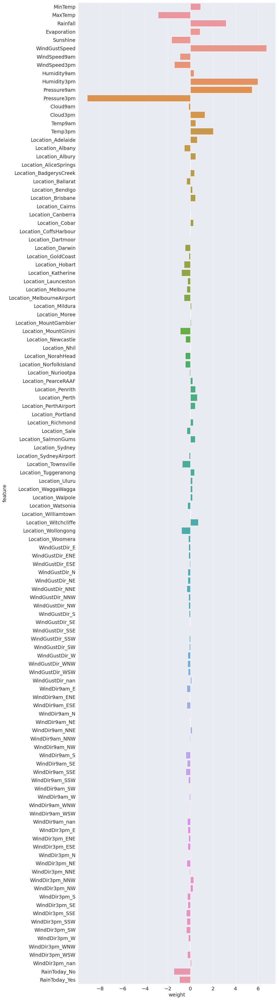

In [46]:
plt.figure(figsize=(10,50))
sns.barplot(data=explanation,x='weight',y='feature')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 49, Finished, Available, Finished)

<Axes: xlabel='weight', ylabel='feature'>

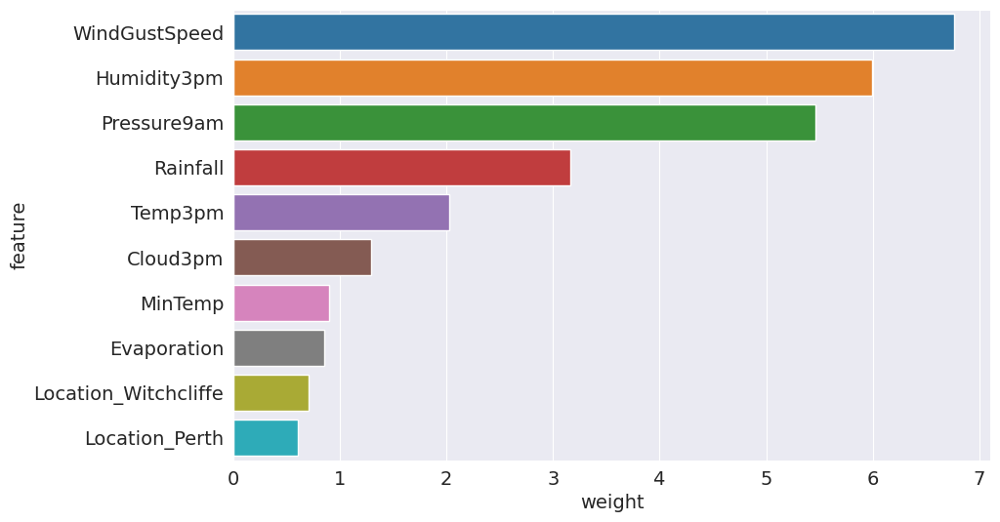

In [47]:
#plt.figure(figsize=(10,50))
sns.barplot(data=explanation.sort_values('weight',ascending=False).head(10),x='weight',y='feature')

MAKING PREDICTIONS AND EVALUATING THE MODEL

In [48]:
X_train=train_inputs[numeric_cols+encoded_cols]
X_val=val_inputs[numeric_cols+encoded_cols]
X_test=test_inputs[numeric_cols+encoded_cols]

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 50, Finished, Available, Finished)

In [49]:
train_predict=model.predict(X_train)
train_predict

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 51, Finished, Available, Finished)

2024-07-30:14:59:31,279 WARNING  [tracking_store.py:153] log_inputs not supported


array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [50]:
train_targets

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 52, Finished, Available, Finished)

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: object

In [51]:
from sklearn.metrics import accuracy_score
accuracy_score(train_targets,train_predict)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 53, Finished, Available, Finished)

0.8519206433440829

In [52]:
from sklearn.metrics import confusion_matrix
confusion_matrix(train_targets,train_predict,normalize='true')
def predict_and_plot(inputs,targets,name=''):
    preds=model.predict(inputs)
    accuracy=accuracy_score(targets,preds)
    print('Accuracy: {:.2f}%'.format(accuracy*100))
    cf=confusion_matrix(targets,preds,normalize='true')
    plt.figure()
    sns.heatmap(cf,annot=True)
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.title('{} Confusion Matrix'.format(name));
    return preds

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 54, Finished, Available, Finished)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 55, Finished, Available, Finished)

2024-07-30:14:59:37,211 WARNING  [tracking_store.py:153] log_inputs not supported


Accuracy: 85.19%


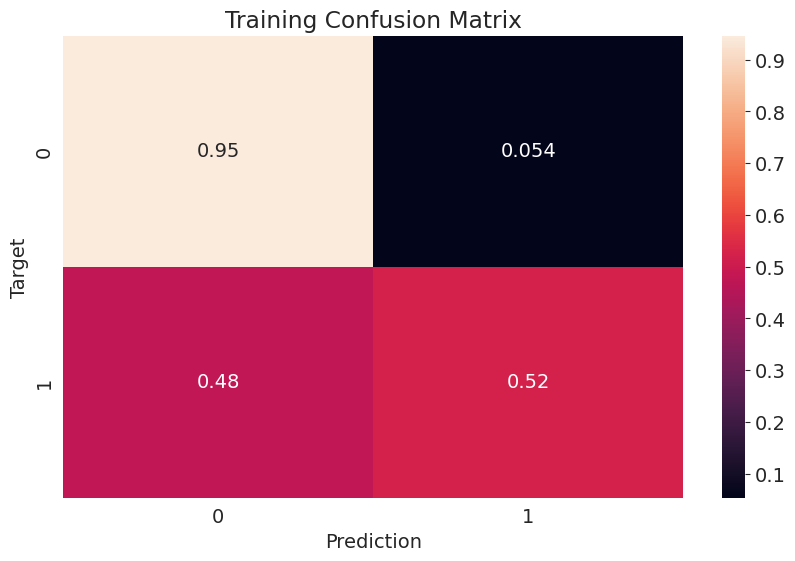

In [53]:
train_preds=predict_and_plot(X_train,train_targets,'Training')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 56, Finished, Available, Finished)

2024-07-30:14:59:40,126 WARNING  [tracking_store.py:153] log_inputs not supported


Accuracy: 85.40%


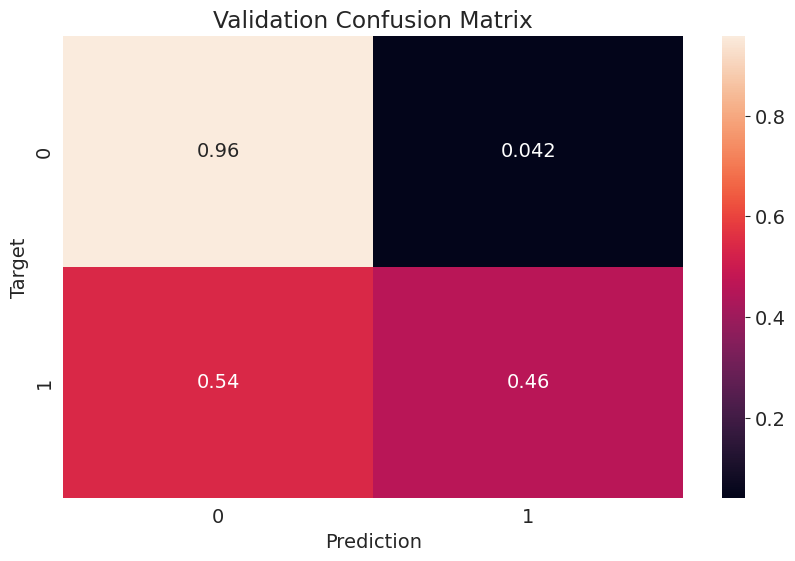

In [54]:
val_preds=predict_and_plot(X_val,val_targets,'Validation')

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 57, Finished, Available, Finished)

2024-07-30:14:59:42,185 WARNING  [tracking_store.py:153] log_inputs not supported


Accuracy: 84.20%


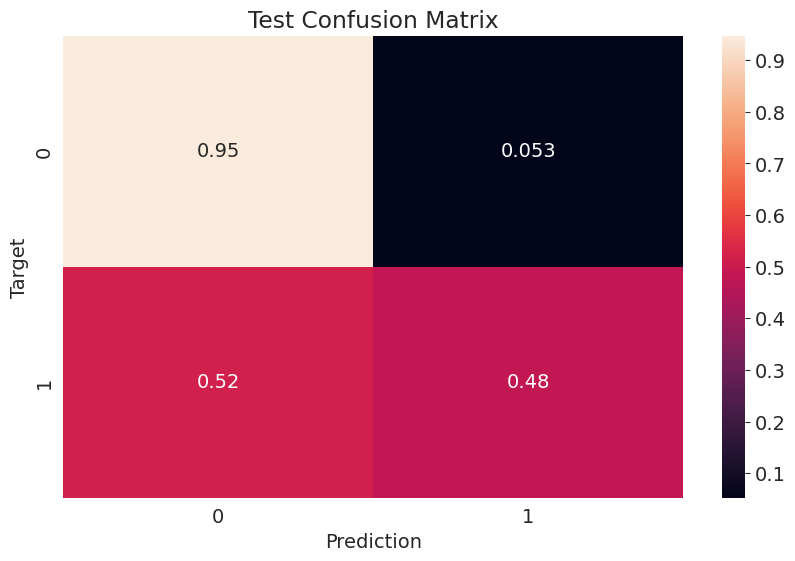

In [55]:
test_preds=predict_and_plot(X_test,test_targets,'Test')

MAKING PREDICTIONS ON A SINGLE INPUT

In [56]:
new_input={
    'Date':'2021-06-19',
    'Location': 'Katherine',
    'MinTemp': 23.2,
    'MaxTemp': 33.2,
    'Rainfall': 10.2,
    'Evaporation': 4.2,
    'Sunshine': np.nan,
    'WindGustDir': 'NNW',
    'WindGustSpeed': 2.0,
    'WindDir9am': 'NW',
    'WindDir3pm': 'NNE',
    'WindSpeed9am': 13.0,
    'WindSpeed3pm': 20.0,
    'Humidity9am': 89.0,
    'Humidity3pm': 58.0,
    'Pressure9am': 1004.8,
    'Pressure3pm': 1001.5,
    'Cloud9am': 8.0,
    'Cloud3pm': 5.0,
    'Temp9am': 25.7,
    'Temp3pm': 33.0,
    'RainToday': 'Yes'
}

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 58, Finished, Available, Finished)

In [57]:
new_input_df=pd.DataFrame([new_input])
new_input_df

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 59, Finished, Available, Finished)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday
0,2021-06-19,Katherine,23.2,33.2,10.2,4.2,NaN,NNW,2.0,NW,NNE,13.0,20.0,89.0,58.0,1004.8,1001.5,8.0,5.0,25.7,33.0,Yes


In [58]:
new_input_df[numeric_cols]=imputer.transform(new_input_df[numeric_cols])
new_input_df[numeric_cols]=scaler.transform(new_input_df[numeric_cols])
new_input_df[encoded_cols]=encoder.transform(new_input_df[categorical_cols])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 60, Finished, Available, Finished)

/tmp/ipykernel_6069/3761423533.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/3761423533.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/3761423533.py:3: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

/tmp/ipykernel_6069/3761423533.py:3: PerformanceWarn

In [59]:
X_new_input=new_input_df[numeric_cols+encoded_cols]
X_new_input

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 61, Finished, Available, Finished)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindGustDir_nan,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir9am_nan,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW,WindDir3pm_nan,RainToday_No,RainToday_Yes
0,0.747642,0.718336,0.027493,0.028966,0.526244,-0.031008,0.1,0.229885,0.89,0.58,0.401653,0.3904,0.888889,0.555556,0.694093,0.737044,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [60]:
prediction=model.predict(X_new_input)
prediction

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 62, Finished, Available, Finished)

2024-07-30:14:59:47,464 WARNING  [tracking_store.py:153] log_inputs not supported


array(['No'], dtype=object)

TRAINING AND VISUALIZING DECISION TREES

In [61]:
import mlflow
experiment_name="rain_decisiontrees"
mlflow.set_experiment(experiment_name)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 63, Finished, Available, Finished)

<Experiment: artifact_location='', creation_time=1722299595092, experiment_id='4cf76934-e221-4fbd-88ab-9af26dddfa27', last_update_time=None, lifecycle_stage='active', name='rain_decisiontrees', tags={}>

In [62]:
from sklearn.tree import DecisionTreeClassifier
with mlflow.start_run():
    mlflow.autolog()
    model=DecisionTreeClassifier(random_state=42)
    model.fit(X_train,train_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 64, Finished, Available, Finished)

2024/07/30 14:59:49 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 14:59:49 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:14:59:50,879 WARNING  [tracking_store.py:153] log_inputs not supported


In [63]:
train_preds=model.predict(X_train)
train_preds

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 65, Finished, Available, Finished)

2024-07-30:15:00:04,854 WARNING  [tracking_store.py:153] log_inputs not supported


array(['No', 'No', 'No', ..., 'No', 'No', 'No'], dtype=object)

In [64]:
from sklearn.metrics import accuracy_score
accuracy_score(train_preds,train_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 66, Finished, Available, Finished)

0.9999795893374699

In [65]:
model.score(X_val,val_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 67, Finished, Available, Finished)

0.7936684416876353

In [66]:
model.score(X_test,test_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 68, Finished, Available, Finished)

0.7756126021003501

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 69, Finished, Available, Finished)

[Text(0.5, 0.875, 'Humidity3pm <= 0.715\ngini = 0.346\nsamples = 97988\nvalue = [76190, 21798]'),
 Text(0.25, 0.625, 'Humidity3pm <= 0.512\ngini = 0.244\nsamples = 81588\nvalue = [69975, 11613]'),
 Text(0.125, 0.375, 'Sunshine <= 0.525\ngini = 0.142\nsamples = 47657\nvalue = [43985, 3672]'),
 Text(0.0625, 0.125, '\n  (...)  \n'),
 Text(0.1875, 0.125, '\n  (...)  \n'),
 Text(0.375, 0.375, 'WindGustSpeed <= 0.333\ngini = 0.359\nsamples = 33931\nvalue = [25990, 7941]'),
 Text(0.3125, 0.125, '\n  (...)  \n'),
 Text(0.4375, 0.125, '\n  (...)  \n'),
 Text(0.75, 0.625, 'Humidity3pm <= 0.825\ngini = 0.471\nsamples = 16400\nvalue = [6215, 10185]'),
 Text(0.625, 0.375, 'Rainfall <= 0.007\ngini = 0.499\nsamples = 9053\nvalue = [4772, 4281]'),
 Text(0.5625, 0.125, '\n  (...)  \n'),
 Text(0.6875, 0.125, '\n  (...)  \n'),
 Text(0.875, 0.375, 'Rainfall <= 0.009\ngini = 0.316\nsamples = 7347\nvalue = [1443, 5904]'),
 Text(0.8125, 0.125, '\n  (...)  \n'),
 Text(0.9375, 0.125, '\n  (...)  \n')]

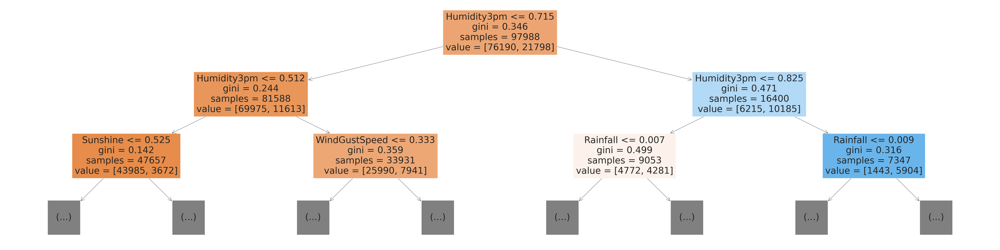

In [67]:
from sklearn.tree import plot_tree, export_text
plt.figure(figsize=(80,20))
plot_tree(model,feature_names=X_train.columns.tolist(), max_depth=2, filled=True)

In [68]:
importance_df=pd.DataFrame({'feature':X_train.columns,'importance':model.feature_importances_}).sort_values(by='importance',ascending=False)
importance_df.head(10)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 70, Finished, Available, Finished)

,feature,importance
9,Humidity3pm,0.278697
11,Pressure3pm,0.062246
5,WindGustSpeed,0.060216
4,Sunshine,0.047403
2,Rainfall,0.044681
10,Pressure9am,0.037475
8,Humidity9am,0.037272
0,MinTemp,0.037235
14,Temp9am,0.035200
15,Temp3pm,0.032817


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 71, Finished, Available, Finished)

<Axes: title={'center': 'Feature Importance'}, xlabel='importance', ylabel='feature'>

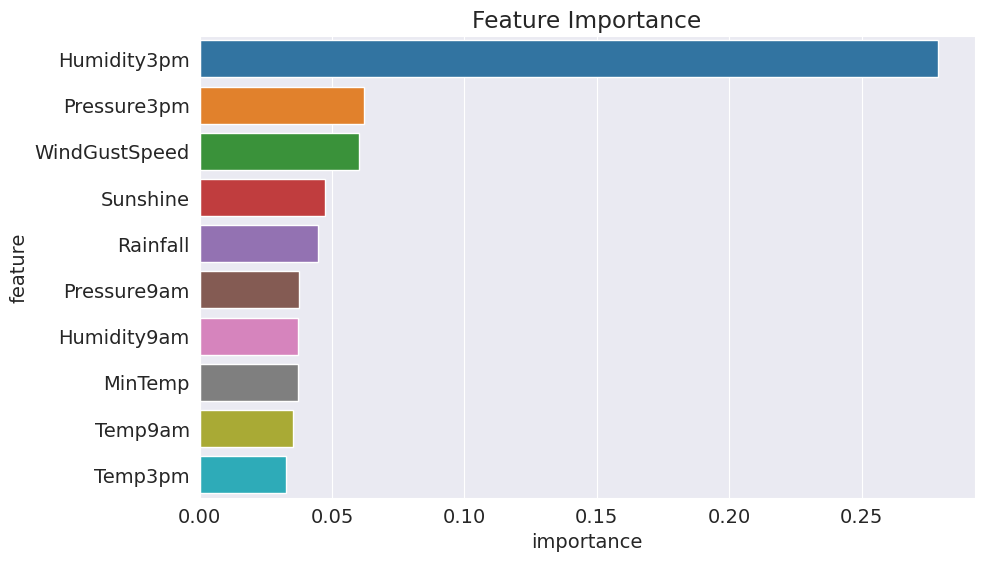

In [69]:
plt.title('Feature Importance')
sns.barplot(importance_df.head(10),x='importance',y='feature')

HYPERPARAMETER TUNING AND OVERFITTING
#reducing overfitting is termed as regularization
#hyperparameters are parameters of the model that we can manually pass and change
#by reducing max_depth we can prevent our model tree from memorizing all training examples leading to better generalization


In [70]:
experiment_name='rain_maxdepth_decisiontree'
mlflow.set_experiment(experiment_name)
with mlflow.start_run():
    mlflow.autolog()
    model=DecisionTreeClassifier(max_depth=3, random_state=42)
    model.fit(X_train,train_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 72, Finished, Available, Finished)

2024/07/30 15:00:16 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 15:00:16 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:15:00:17,557 WARNING  [tracking_store.py:153] log_inputs not supported


In [71]:
model.score(X_train,train_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 73, Finished, Available, Finished)

0.8315916234640977

In [72]:
model.score(X_val,val_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 74, Finished, Available, Finished)

0.8348060155655685

In [76]:
plt.figure(figsize=(80,20))
plot_tree(model,feature_names=X_train.columns.tolist(),filled=True,rounded=True, class_names=model.classes_)

StatementMeta(, 0c226672-0754-4892-92e0-bf6203c1236d, 78, Finished, Available, Finished)

InvalidParameterError: The 'feature_names' parameter of plot_tree must be an instance of 'list' or None. Got Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm',
       ...
       'WindDir3pm_SE', 'WindDir3pm_SSE', 'WindDir3pm_SSW', 'WindDir3pm_SW',
       'WindDir3pm_W', 'WindDir3pm_WNW', 'WindDir3pm_WSW', 'WindDir3pm_nan',
       'RainToday_No', 'RainToday_Yes'],
      dtype='object', length=118) instead.

In [73]:
print(export_text(model,feature_names=list(X_train.columns)))

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 75, Finished, Available, Finished)

|--- Humidity3pm <= 0.72
|   |--- Humidity3pm <= 0.51
|   |   |--- Sunshine <= 0.53
|   |   |   |--- class: No
|   |   |--- Sunshine >  0.53
|   |   |   |--- class: No
|   |--- Humidity3pm >  0.51
|   |   |--- WindGustSpeed <= 0.33
|   |   |   |--- class: No
|   |   |--- WindGustSpeed >  0.33
|   |   |   |--- class: No
|--- Humidity3pm >  0.72
|   |--- Humidity3pm <= 0.82
|   |   |--- Rainfall <= 0.01
|   |   |   |--- class: No
|   |   |--- Rainfall >  0.01
|   |   |   |--- class: Yes
|   |--- Humidity3pm >  0.82
|   |   |--- Rainfall <= 0.01
|   |   |   |--- class: Yes
|   |   |--- Rainfall >  0.01
|   |   |   |--- class: Yes



In [74]:
#using a helper function to find the best depth
def max_depth_error(md):
    model=DecisionTreeClassifier(max_depth=md,random_state=42)
    model.fit(X_train,train_targets)
    train_error=1-model.score(X_train,train_targets)
    val_error=1-model.score(X_val,val_targets)
    return{'Max Depth':md, 'Training Error':train_error, 'Validation Error':val_error}

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 76, Finished, Available, Finished)

In [75]:
errors_df=pd.DataFrame([max_depth_error(md) for md in range(1,21)])

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 77, Finished, Available, Finished)

2024/07/30 15:00:32 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '0d828354-92ef-4300-9ef3-b3e4ca17306c', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:00:34,165 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:00:44 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'd74fdbe5-c2e3-4a60-871c-4b036e35e3df', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:00:45,663 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:00:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '2a39cf93-a90c-443c-b54a-689e436c1de9', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:00:57,218 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:01:07 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '6ae25e80-9e89-4884-9549-7fe6d9a95d94', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:01:08,775 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:01:19 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'fdd7d8e7-7c20-4d81-82c7-6e9bb03766a8', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:01:20,743 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:01:30 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'ada10a58-5a2f-458b-992c-ed36443d9919', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:01:32,422 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:01:42 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '0fa9f733-5499-45dd-bcac-1a8bdb09dab2', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:01:44,546 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:01:55 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'dc4a6ac5-4b42-47f7-aae9-526953d897f6', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:01:56,585 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:02:07 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'd1089e6b-8ba2-445f-be04-9cfd96e510c1', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:02:09,138 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:02:20 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '31e328db-3974-455e-aa8f-de2eaa1c9d21', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:02:21,521 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:02:32 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '6bb6c454-9752-49c9-b16e-13ea7b09c8d8', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:02:33,701 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:02:44 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '65cac3e2-5560-4fd8-a62d-fc1c53d82b00', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:02:46,157 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:02:57 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'e0fe0e80-f898-4cb4-b42d-b507239f5769', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:02:58,940 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:03:10 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '60713972-04b4-4954-a817-b8b6db9eaaf0', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:03:11,845 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:03:23 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'eecb4cf3-35e8-4731-8804-4eac4fe55094', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:03:24,527 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:03:35 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'cd8b5d25-555d-4b87-83aa-e0136f32dff9', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:03:37,293 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:03:48 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '10d1ef7b-3106-43ed-ae9c-0397d12a2098', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:03:50,419 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:04:02 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '567f528b-a825-4196-9829-2bccadb4ae9b', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:04:04,77 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:04:16 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'bf1e6000-f822-46dc-8c33-cb34d4a94086', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:04:17,680 WARNING  [tracking_store.py:153] log_inputs not supported


2024/07/30 15:04:29 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'c3ef1927-24e8-48aa-abff-6235f931dc3a', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:04:31,90 WARNING  [tracking_store.py:153] log_inputs not supported


In [76]:
errors_df

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 78, Finished, Available, Finished)

,Max Depth,Training Error,Validation Error
0,1,0.181941,0.176488
1,2,0.176930,0.170695
2,3,0.168408,0.165194
3,4,0.162153,0.161624
4,5,0.157244,0.158113
5,6,0.153131,0.155831
6,7,0.149059,0.154602
7,8,0.144814,0.153842
8,9,0.139435,0.154544
9,10,0.131802,0.154778


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 79, Finished, Available, Finished)

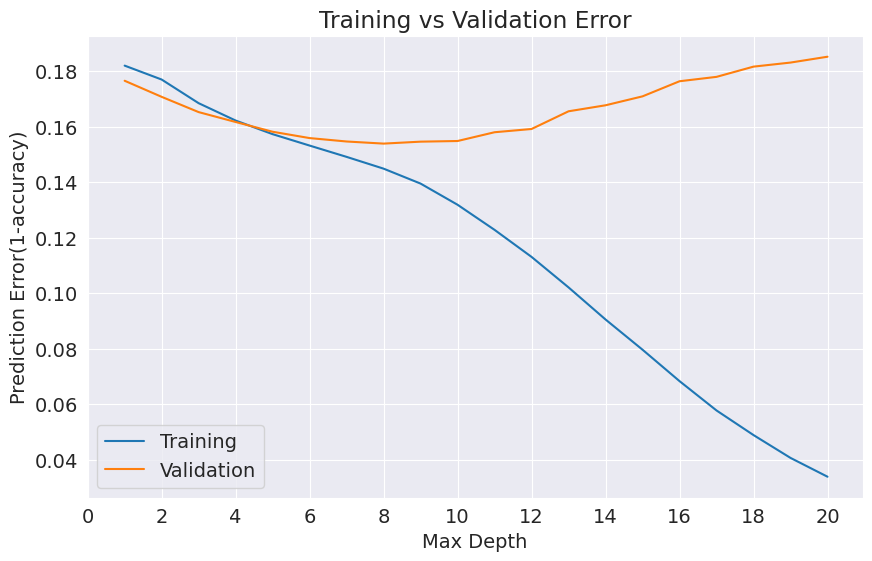

In [77]:
plt.figure()
plt.plot(errors_df['Max Depth'],errors_df['Training Error'])
plt.plot(errors_df['Max Depth'],errors_df['Validation Error'])
plt.title('Training vs Validation Error')
plt.xticks(range(0,21,2))
plt.xlabel('Max Depth')
plt.ylabel('Prediction Error(1-accuracy)')
plt.legend(['Training','Validation'])

In [78]:
#from the graph it seems depth 6 gives a near(optimal) training and validation error
#we try to get the training and validation score as closer as possible to reduce overfitting models
model=DecisionTreeClassifier(max_depth=6,random_state=42)
model.fit(X_train,train_targets)
print(model.score(X_train,train_targets))
print(model.score(X_val,val_targets))

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 80, Finished, Available, Finished)

2024/07/30 15:04:48 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID 'ebad9fbe-0325-4557-b3c6-f30348e8cfcd', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:04:49,776 WARNING  [tracking_store.py:153] log_inputs not supported


0.8468690043678818
0.8441687635320967


In [79]:
#Tuning max_leaf_nodes
model=DecisionTreeClassifier(max_leaf_nodes=128,random_state=42)
model.fit(X_train,train_targets)
print(model.score(X_train,train_targets))
print(model.score(X_val,val_targets))
print(model.tree_.max_depth)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 81, Finished, Available, Finished)

2024/07/30 15:05:00 INFO mlflow.utils.autologging_utils: Created MLflow autologging run with ID '68be68da-9c0b-4ae1-9445-d264b9f0f2f0', which will track hyperparameters, performance metrics, model artifacts, and lineage information for the current sklearn workflow
2024-07-30:15:05:02,439 WARNING  [tracking_store.py:153] log_inputs not supported


0.852696248520227
0.8471531394464276
11


TRAINING A RANDOM FOREST   

In [80]:
#a random forest uses several decision trees to train the model getting as close to reality as possible
experiment_name='rain_randomforest'
mlflow.set_experiment(experiment_name)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 82, Finished, Available, Finished)

<Experiment: artifact_location='', creation_time=1722345520988, experiment_id='78846cd3-b3c0-45c3-b1bb-3b9d82ff01b1', last_update_time=None, lifecycle_stage='active', name='rain_randomforest', tags={}>

In [81]:
from sklearn.ensemble import RandomForestClassifier
with mlflow.start_run():
    mlflow.autolog()
    model=RandomForestClassifier(n_jobs=-1,random_state=42)
    model.fit(X_train,train_targets)


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 83, Finished, Available, Finished)

2024/07/30 15:05:19 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 15:05:19 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:15:05:21,80 WARNING  [tracking_store.py:153] log_inputs not supported


In [82]:
print(model.score(X_train,train_targets))
print(model.score(X_val,val_targets))

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 84, Finished, Available, Finished)

0.9999693840062048
0.8567499561121189


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 85, Finished, Available, Finished)

[Text(0.5, 0.875, 'RainToday_Yes <= 0.5\ngini = 0.348\nsamples = 61980\nvalue = [76040, 21948]'),
 Text(0.25, 0.625, 'Humidity9am <= 0.695\ngini = 0.259\nsamples = 48100\nvalue = [64388, 11594]'),
 Text(0.125, 0.375, 'WindGustSpeed <= 0.38\ngini = 0.197\nsamples = 28238\nvalue = [39743, 4946]'),
 Text(0.0625, 0.125, '\n  (...)  \n'),
 Text(0.1875, 0.125, '\n  (...)  \n'),
 Text(0.375, 0.375, 'MaxTemp <= 0.328\ngini = 0.335\nsamples = 19862\nvalue = [24645, 6648]'),
 Text(0.3125, 0.125, '\n  (...)  \n'),
 Text(0.4375, 0.125, '\n  (...)  \n'),
 Text(0.75, 0.625, 'Cloud9am <= 0.389\ngini = 0.498\nsamples = 13880\nvalue = [11652, 10354]'),
 Text(0.625, 0.375, 'Cloud3pm <= 0.722\ngini = 0.331\nsamples = 1644\nvalue = [2061, 545]'),
 Text(0.5625, 0.125, '\n  (...)  \n'),
 Text(0.6875, 0.125, '\n  (...)  \n'),
 Text(0.875, 0.375, 'WindSpeed3pm <= 0.351\ngini = 0.5\nsamples = 12236\nvalue = [9591, 9809]'),
 Text(0.8125, 0.125, '\n  (...)  \n'),
 Text(0.9375, 0.125, '\n  (...)  \n')]

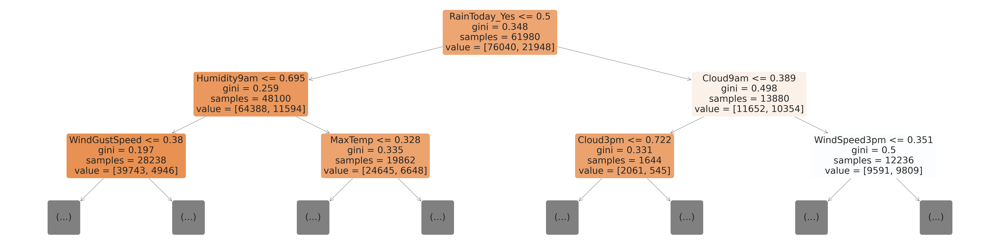

In [83]:
plt.figure(figsize=(80,20))
plot_tree(model.estimators_[20],max_depth=2,feature_names=X_train.columns.tolist(),filled=True,rounded=True)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 86, Finished, Available, Finished)

[Text(0.5, 0.875, 'Sunshine <= 0.403\ngini = 0.344\nsamples = 61960\nvalue = [76344, 21644]'),
 Text(0.25, 0.625, 'Location_Cairns <= 0.5\ngini = 0.499\nsamples = 11206\nvalue = [9273, 8335]'),
 Text(0.125, 0.375, 'Rainfall <= 0.007\ngini = 0.498\nsamples = 10799\nvalue = [9032, 7934]'),
 Text(0.0625, 0.125, '\n  (...)  \n'),
 Text(0.1875, 0.125, '\n  (...)  \n'),
 Text(0.375, 0.375, 'WindDir9am_nan <= 0.5\ngini = 0.469\nsamples = 407\nvalue = [241, 401]'),
 Text(0.3125, 0.125, '\n  (...)  \n'),
 Text(0.4375, 0.125, '\n  (...)  \n'),
 Text(0.75, 0.625, 'RainToday_Yes <= 0.5\ngini = 0.276\nsamples = 50754\nvalue = [67071, 13309]'),
 Text(0.625, 0.375, 'Humidity9am <= 0.675\ngini = 0.203\nsamples = 41293\nvalue = [57901, 7511]'),
 Text(0.5625, 0.125, '\n  (...)  \n'),
 Text(0.6875, 0.125, '\n  (...)  \n'),
 Text(0.875, 0.375, 'Temp3pm <= 0.383\ngini = 0.475\nsamples = 9461\nvalue = [9170, 5798]'),
 Text(0.8125, 0.125, '\n  (...)  \n'),
 Text(0.9375, 0.125, '\n  (...)  \n')]

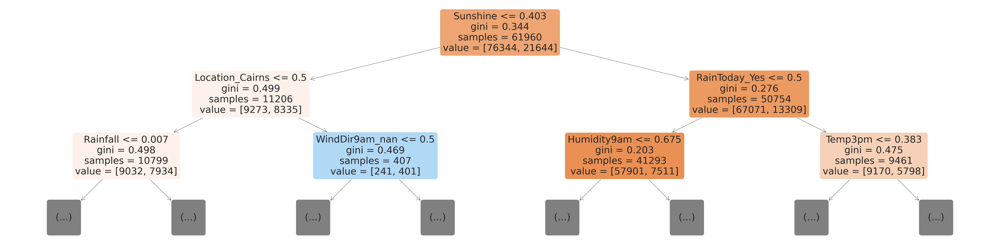

In [84]:
plt.figure(figsize=(80,20))
plot_tree(model.estimators_[0],max_depth=2,feature_names=X_train.columns.tolist(),filled=True,rounded=True)

In [85]:
#as shown from the decision tree plots, none of the decision trees are the same
importance_df=pd.DataFrame({'feature':X_train.columns,'importance':model.feature_importances_}).sort_values(by='importance',ascending=False)
importance_df.head(10)


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 87, Finished, Available, Finished)

,feature,importance
9,Humidity3pm,0.129273
4,Sunshine,0.059835
11,Pressure3pm,0.053178
8,Humidity9am,0.051036
10,Pressure9am,0.049215
5,WindGustSpeed,0.047183
2,Rainfall,0.046710
15,Temp3pm,0.046196
1,MaxTemp,0.042871
0,MinTemp,0.042163


In [86]:
#less skew between features as compared to the decisiontree model
#Hyperparameter tuning for randomforest
#first make a base model
#a random forest uses several decision trees to train the model getting as close to reality as possible
experiment_name='rain_base_randomforest'
mlflow.set_experiment(experiment_name)
with mlflow.start_run():
    mlflow.autolog()
    base_model=RandomForestClassifier(n_jobs=-1,random_state=42).fit(X_train,train_targets)


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 88, Finished, Available, Finished)

2024/07/30 15:05:48 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 15:05:48 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:15:05:49,993 WARNING  [tracking_store.py:153] log_inputs not supported


In [87]:
#using the n_estimators(number of decision trees used) hyperparameter
experiment_name='rain_hyperparameter_n_estimators_randomforest'
mlflow.set_experiment(experiment_name)
with mlflow.start_run():
    mlflow.autolog()
    model=RandomForestClassifier(random_state=42,n_jobs=-1,n_estimators=500)
    model.fit(X_train,train_targets)


StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 89, Finished, Available, Finished)

2024/07/30 15:06:10 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/07/30 15:06:10 INFO mlflow.tracking.fluent: Autologging successfully enabled for statsmodels.
2024-07-30:15:06:11,507 WARNING  [tracking_store.py:153] log_inputs not supported


In [88]:
model.score(X_train,train_targets), model.score(X_val,val_targets)

StatementMeta(, 7405ea63-a0f8-44ac-884b-1273dadbe3ee, 90, Finished, Available, Finished)

(0.9999795893374699, 0.8575106793843993)